<a href="https://www.kaggle.com/code/vainero/boston-house-price-ensemble-methods?scriptVersionId=119134043" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<img src="https://github.com/vainero/Files/blob/main/house.png?raw=true">

<h3 style="color:#705e5d; font-style:italic; font-family:Cursive;"> <center>Thanks for visiting my notebook!</center> </h3>

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Content</p>

<p style="font-family:JetBrains Mono;font-size:150%;color:#705e5d; letter-spacing: 2px">Each record in the database describes a Boston suburb or town. The data was drawn from the Boston Standard Metropolitan Statistical Area (SMSA) in 1970. The attributes are deﬁned as follows (taken from the UCI Machine Learning Repository): </p>


**CRIM**: per capita crime rate by town

**ZN**: proportion of residential land zoned for lots over 25,000 sq.ft.

**INDUS**: proportion of non-retail business acres per town

**CHAS**: Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)

**NOX**: nitric oxides concentration (parts per 10 million)

**RM**: average number of rooms per dwelling

**AGE**: proportion of owner-occupied units built prior to 1940

**DIS**: weighted distances to ﬁve Boston employment centers

**RAD**: index of accessibility to radial highways

**TAX**: full-value property-tax rate per $10,000

**PTRATIO**: pupil-teacher ratio by town 

**B**: 1000(Bk−0.63)2 where Bk is the proportion of blacks by town 

**LSTAT**: % lower status of the population

**MEDV**: Median value of owner-occupied homes in $1,000. 

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Import Libraries</p>

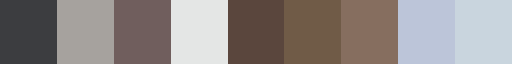

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap
from numpy import arange
import seaborn as sns
import pandas_profiling as pp
%matplotlib inline


from pandas import read_csv
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split as split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error 

# Create palette
cmap = colors.ListedColormap(["#3c3d40", "#a6a29e", "#705e5d", '#e4e6e5', "#5a463d", '#705b47', 
                              '#866e5f', "#bcc5d9", "#c9d5de"])
cmap

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Load Data</p>

In [3]:
column_names = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 
                'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
boston = read_csv('../input/boston-house-prices/housing.csv', header=None, 
                  delimiter=r"\s+", names=column_names)
#boston.head()
boston.head().style.background_gradient(cmap=cmap).set_properties(**{'font-family': 'JetBrains Mono'})

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006320,18.000000,2.310000,0,0.538000,6.575000,65.200000,4.090000,1,296.000000,15.300000,396.900000,4.980000,24.000000
1,0.027310,0.000000,7.070000,0,0.469000,6.421000,78.900000,4.967100,2,242.000000,17.800000,396.900000,9.140000,21.600000
2,0.027290,0.000000,7.070000,0,0.469000,7.185000,61.100000,4.967100,2,242.000000,17.800000,392.830000,4.030000,34.700000
3,0.032370,0.000000,2.180000,0,0.458000,6.998000,45.800000,6.062200,3,222.000000,18.700000,394.630000,2.940000,33.400000
4,0.069050,0.000000,2.180000,0,0.458000,7.147000,54.200000,6.062200,3,222.000000,18.700000,396.900000,5.330000,36.200000


# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Analyze Data</p>

In [4]:
# Pandas Profiling Report
report = pp.ProfileReport(boston)
display(report)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Descriptive Statistics</p>

In [5]:
# Some information
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


>   📝**Observations**:
> 
> * The data has 506 entries, and 14 features
> * Most of the features of the float type
> * There is no missing data


In [6]:
# Summarize the description of each attribute
boston.describe().style.background_gradient(cmap=cmap).set_properties(**{'font-family': 'JetBrains Mono'})

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Visualization</p>

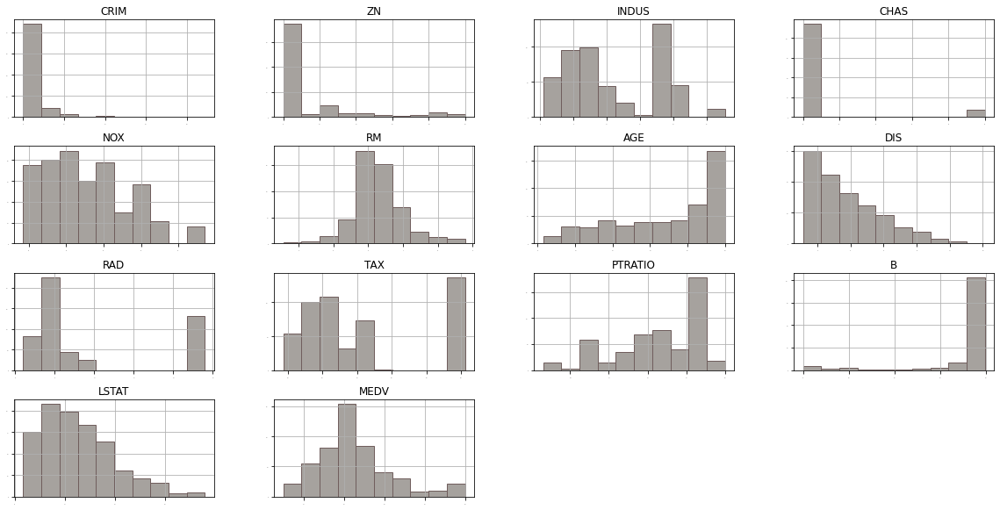

In [7]:
# The histogram for each attribute
boston.hist(xlabelsize=1, ylabelsize=1, figsize = (20,10), color = '#a6a29e', ec = '#705e5d', lw=1);


>   📝**Observations**:
> 
> * Some attributes may have an exponential distribution, such as **CRIM**, **ZN**,**AGE** and **B**.
> * We can see that others may have a bimodal distribution such as **RAD** and **TAX**

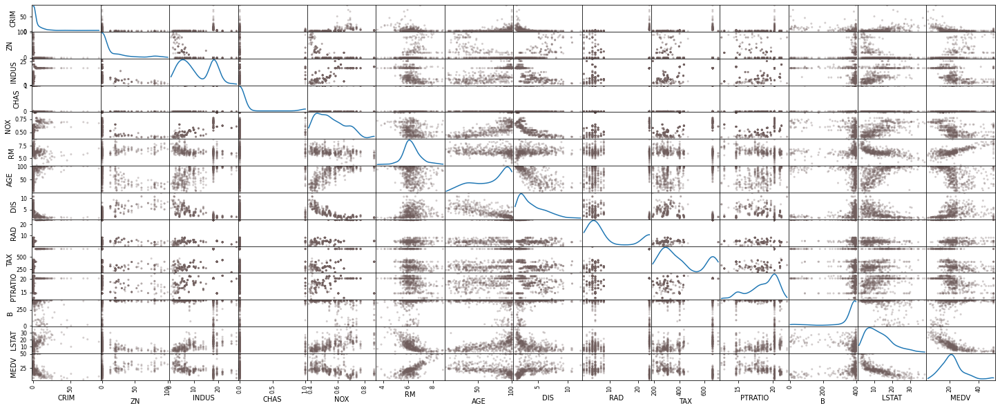

In [8]:
# The visualization of the interactions between variables
scatter_matrix(boston,  alpha = 0.3, figsize = (25,10), color = '#705e5d', diagonal = 'kde')
plt.show() 

> - Some of the higher correlated attributes do show good structure in their relationship

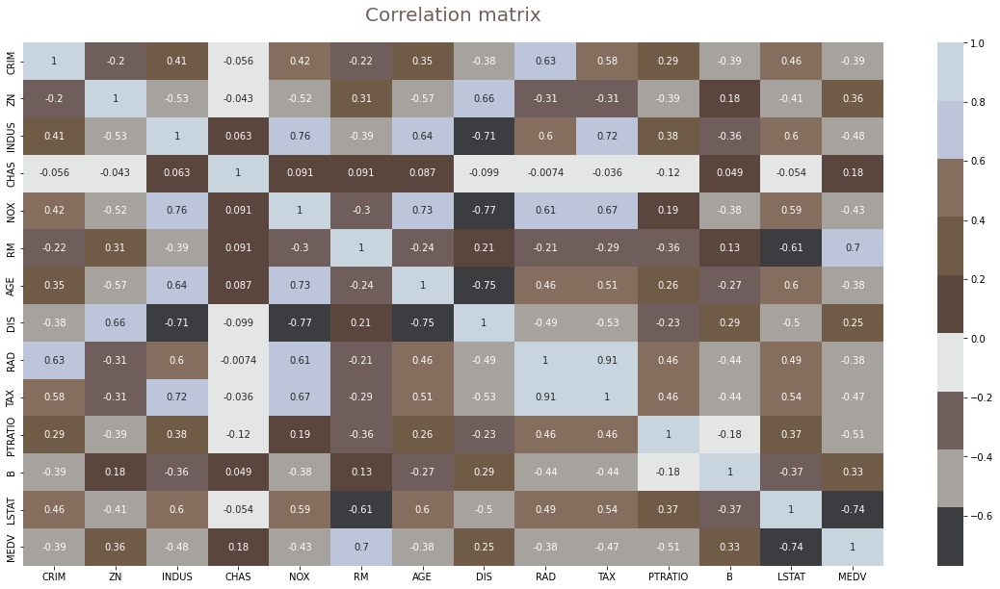

In [9]:
# Correlation matrix
plt.figure(figsize = (20,10))
plt.title('Correlation matrix',fontsize=20, color = '#705e5d', y=1.03)
sns.heatmap(boston.corr(), annot=True, cmap = cmap);

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Split Data</p>

In [10]:
# Split-out validation dataset (70/30)
array = boston.values
X = array[:,0:13]
Y = array[:,13]

X_train, X_val, Y_train, Y_val = split(X, Y, test_size=0.3, random_state=1313)

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Evaluate Algorithms</p>

<p style="font-family:JetBrains Mono;font-size:140%;color:#705e5d; letter-spacing: 2px; font-weight: bold">Linear Algorithms:</p> 


>       Linear Regression (LR)
>  
>       Lasso Regression (LASSO) 
>  
>       ElasticNet (EN)

<p style="font-family:JetBrains Mono;font-size:140%;color:#705e5d;letter-spacing: 2px; font-weight: bold">Nonlinear Algorithms:</p>


 >      Classification and Regression Trees (CART)
 >
 >      Support Vector Regression (SVR) 
 >   
 >      k-Nearest Neighbors (KNN)

In [11]:
# Test options and evaluation metric
num_folds = 10
scoring = 'neg_mean_squared_error' 

# Spot-Check Algorithms
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [12]:
# Evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
        
    print('\033[94m {}: MSE = {}, std = {}'.format(name, cv_results.mean(),
                                          cv_results.std()))


 LR: MSE = -27.361311408586392, std = 9.9350900627506
 LASSO: MSE = -32.981514128886424, std = 12.250117565268319
 EN: MSE = -32.12114378451524, std = 11.829338080851787
 KNN: MSE = -47.93050758730159, std = 23.644273855543908
 CART: MSE = -37.06517857142857, std = 30.733117763570487
 SVR: MSE = -74.64354750628924, std = 38.6337220320373


> * The distribution of scores across all cross-validation folds

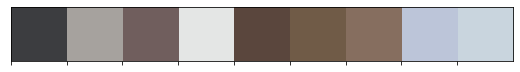

In [13]:
# Create palette for the boxplots
cmap1 = ["#3c3d40", "#a6a29e", "#705e5d", '#e4e6e5', "#5a463d", '#705b47', 
                              '#866e5f', "#bcc5d9", "#c9d5de"]
sns.palplot(sns.color_palette(cmap1))

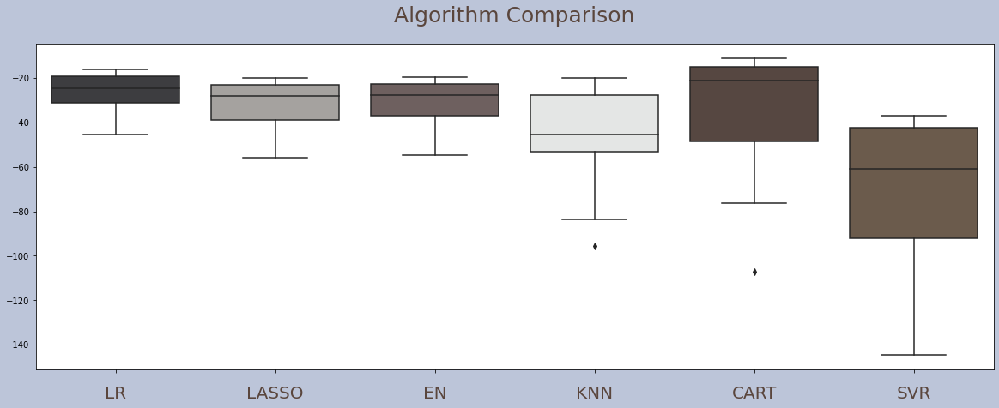

In [14]:
# Compare Algorithms
fig = plt.figure(figsize = (20,7), facecolor = '#bcc5d9')
fig.suptitle 
ax = fig.add_subplot(111)
sns.boxplot(data = results, palette = cmap1) 
ax.set_xticklabels(names, size=20, color = '#5a463d', y=-0.03)
plt.title('Algorithm Comparison', fontsize=25, color = '#5a463d', y=1.05)
plt.show()

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Evaluate Algorithms: Stardadization</p>

In [15]:
# Standardize the dataset
pipelines = []
pipelines.append(('Scaled_LR', Pipeline([('Scaler', StandardScaler()),('LR', LinearRegression())])))
pipelines.append(('Scaled_LASSO', Pipeline([('Scaler', StandardScaler()),('LASSO', Lasso())])))
pipelines.append(('Scaled_EN', Pipeline([('Scaler', StandardScaler()),('EN', ElasticNet())])))
pipelines.append(('Scaled_KNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsRegressor())])))
pipelines.append(('Scaled_CART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeRegressor())])))
pipelines.append(('Scaled_SVR', Pipeline([('Scaler', StandardScaler()),('SVR', SVR())])))
results = []
names = []
for name, model in pipelines:
    kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('\033[94m {}: MSE = {}, std = {}'.format(name, cv_results.mean(), 
                                          cv_results.std())) 

 Scaled_LR: MSE = -27.3613114085865, std = 9.935090062750588
 Scaled_LASSO: MSE = -33.21344983124289, std = 15.750658658890748
 Scaled_EN: MSE = -35.089060596830635, std = 19.078055572650076
 Scaled_KNN: MSE = -24.06457028571429, std = 12.308420028084821
 Scaled_CART: MSE = -34.346735714285714, std = 28.518716488666445
 Scaled_SVR: MSE = -37.21531702409951, std = 25.876929112205055


> * Scaling did have an effect on KNN, driving the error lower than the other models

<p style="font-family:JetBrains Mono;font-size:150%;color:#705e5d; letter-spacing: 2px">The distribution of the scores across the cross-validation folds </p>

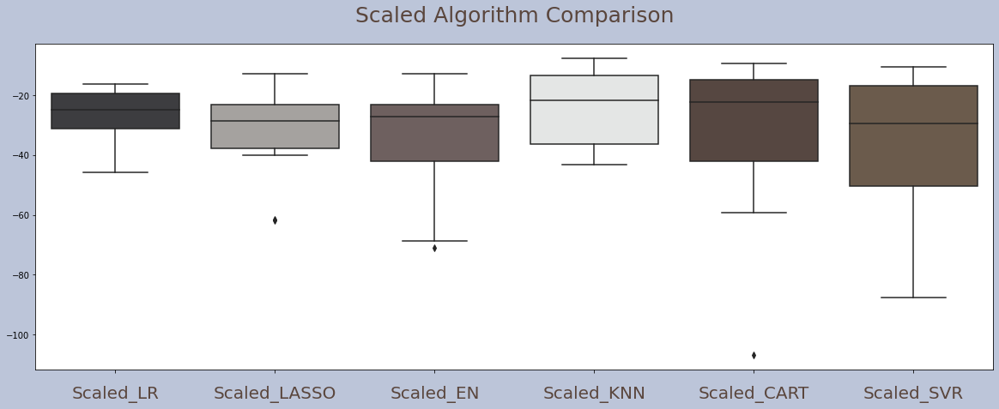

In [16]:
# Compare Algorithms
fig = plt.figure(figsize = (20,7), facecolor = '#bcc5d9')
fig.suptitle 
ax = fig.add_subplot(111)
sns.boxplot(data = results, palette = cmap1) 
ax.set_xticklabels(names, size=20, color = '#5a463d', y=-0.03)
plt.title('Scaled Algorithm Comparison', fontsize=25, color = '#5a463d', y=1.05)
plt.show()

> * KNN has both a tight distribution of error and has the lowest score

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Improve Results With Tuning</p>

In [17]:
# KNN Algorithm tuning
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
k_values = np.array([1,3,5,7,9,11,13,15,17,19,21])
param_grid = dict(n_neighbors=k_values)
model = KNeighborsRegressor()
kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)
print("\033[94m Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
print('\033[94m _'*24)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

 Best: -20.564384 using {'n_neighbors': 3}
 _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _
-26.864780 (15.510805) with: {'n_neighbors': 1}
-20.564384 (12.561021) with: {'n_neighbors': 3}
-24.056696 (12.369413) with: {'n_neighbors': 5}
-24.847278 (12.706571) with: {'n_neighbors': 7}
-24.669319 (13.116020) with: {'n_neighbors': 9}
-25.654495 (14.316809) with: {'n_neighbors': 11}
-25.827475 (15.593796) with: {'n_neighbors': 13}
-27.376040 (17.074584) with: {'n_neighbors': 15}
-28.399404 (17.972374) with: {'n_neighbors': 17}
-29.531670 (19.130921) with: {'n_neighbors': 19}
-29.976996 (19.235626) with: {'n_neighbors': 21}


> * The best for k (n_neighbors) is 3 providing a mean squared error of -20.564384, the best so far

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Ensemble Methods</p>

 <p style="font-family:JetBrains Mono;font-size:140%;color:#705e5d; letter-spacing: 2px; font-weight: bold">Boosting Methods:</p> 


>       AdaBoost (AB)
>  
>       Gradient Boodting (GBM)


<p style="font-family:JetBrains Mono;font-size:140%;color:#705e5d;letter-spacing: 2px; font-weight: bold">Bagging Methods:</p>


 >      Random Forest (RF)
 >
 >      Extra Trees (ET) 

In [18]:
# Ensembles
ensembles = []
ensembles.append(('Scaled_AB', Pipeline([('Scaler', StandardScaler()),('AB', AdaBoostRegressor())])))
ensembles.append(('Scaled_GBM', Pipeline([('Scaler', StandardScaler()),('GBM', GradientBoostingRegressor())])))
ensembles.append(('Scaled_RF', Pipeline([('Scaler', StandardScaler()),('RF', RandomForestRegressor(n_estimators=10))])))
ensembles.append(('Scaled_ET', Pipeline([('Scaler', StandardScaler()),('ET', ExtraTreesRegressor(n_estimators=10))])))
results = []
names = []
for name, model in ensembles:
    kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "\033[94m %s: %f (%f)" % (name, cv_results.mean(), 
                           cv_results.std())
    print(msg) 

 Scaled_AB: -15.251379 (8.675212)
 Scaled_GBM: -12.140042 (7.056452)
 Scaled_RF: -14.386000 (6.717010)
 Scaled_ET: -12.388469 (4.219766)


> * The better scores than our previous linear and nonlinear algorithms

<p style="font-family:JetBrains Mono;font-size:150%;color:#705e5d; letter-spacing: 2px">Let's plot the distribution of scores across the cross-validation folds</p>

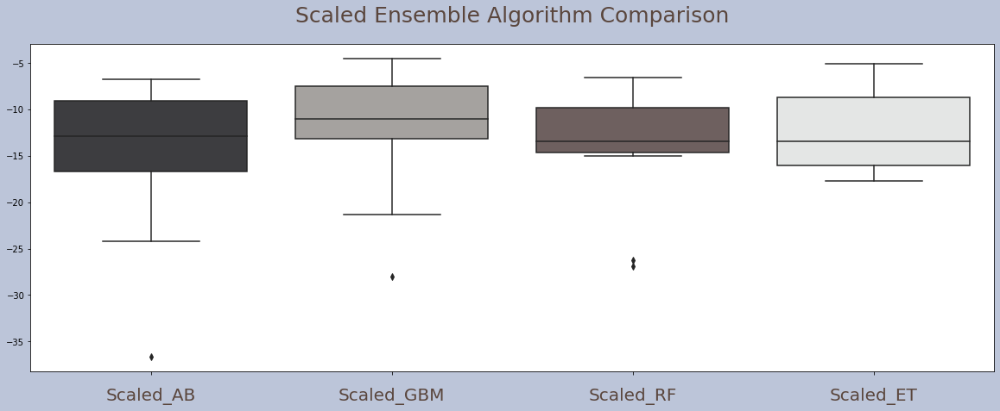

In [19]:
# Compare Algorithms
fig = plt.figure(figsize = (20,7), facecolor = '#bcc5d9')
fig.suptitle 
ax = fig.add_subplot(111)
sns.boxplot(data = results, palette = cmap1) 
ax.set_xticklabels(names, size=20, color = '#5a463d', y=-0.03)
plt.title('Scaled Ensemble Algorithm Comparison', fontsize=25, color = '#5a463d', y=1.05)
plt.show()

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Tune Ensemble Methods</p>

In [20]:
# Tune scaled GBM
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
param_grid = {'n_estimators':[100,200,250,300,400]} 

model = GradientBoostingRegressor(random_state=1313, learning_rate = 0.1,
                                  max_depth = 4, min_samples_leaf = 3)
kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)



print("\033[94m Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
print('\033[94m _'*24)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    

 Best: -11.458447 using {'n_estimators': 250}
 _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _
-11.546070 (5.655048) with: {'n_estimators': 100}
-11.469480 (5.795134) with: {'n_estimators': 200}
-11.458447 (5.816996) with: {'n_estimators': 250}
-11.462882 (5.839673) with: {'n_estimators': 300}
-11.499454 (5.831208) with: {'n_estimators': 400}


In [21]:
# Tune scaled ET
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
param_grid = dict(n_estimators=np.array([100,200,250,300,400]))
model = ExtraTreesRegressor(random_state=1313)

kfold = KFold(n_splits=num_folds, random_state=1313, shuffle=True)
grid = GridSearchCV(estimator=model, param_grid=param_grid, 
                    scoring=scoring, cv=kfold)
grid_result = grid.fit(rescaledX, Y_train)

print("\033[94m Best: %f using %s" % (grid_result.best_score_, 
                             grid_result.best_params_))
print('\033[94m _'*24)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

 Best: -11.570732 using {'n_estimators': 250}
 _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _
-11.629639 (4.714891) with: {'n_estimators': 100}
-11.686285 (4.776718) with: {'n_estimators': 200}
-11.570732 (4.694601) with: {'n_estimators': 250}
-11.777997 (4.829233) with: {'n_estimators': 300}
-11.771581 (4.796872) with: {'n_estimators': 400}


# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid #5a463d">Final Model</p>

<p style="font-family:JetBrains Mono;font-size:150%;color:#705e5d; letter-spacing: 2px">Scale the inputs for the validation dataset and generate predictions </p>

In [22]:
# Prepare the GBM model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = GradientBoostingRegressor(random_state=1313, n_estimators=250, 
                                  learning_rate=0.1, max_depth = 4, 
                                  min_samples_leaf = 3)
model.fit(rescaledX, Y_train)

# Transform the validation dataset
rescaledValidationX = scaler.transform(X_val)
predictions = model.predict(rescaledValidationX)
print('\033[94m GBM model: MSE = {}'.format(mean_squared_error(Y_val, predictions)))

 GBM model: MSE = 6.437299861139799


In [23]:
# Prepare the ET model
scaler = StandardScaler().fit(X_train)
rescaledX = scaler.transform(X_train)
model = ExtraTreesRegressor(random_state=1313, n_estimators=250)
model.fit(rescaledX, Y_train)

# Transform the validation dataset
rescaledValidationX = scaler.transform(X_val)
predictions = model.predict(rescaledValidationX)
print('\033[94m ET model: MSE = {}'.format(mean_squared_error(Y_val, predictions))) 

 ET model: MSE = 7.614296836842118



<h3 style="color:#705e5d; font-style:italic; font-family:Cursive;"> <center>Thanks for visiting my notebook!</center> </h3>

# <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 2px; color:#705e5d; font-size:100%; text-align:center;padding: 0px; border-bottom: 3px solid #5a463d">👍 If you find this notebook useful, I would appreciate an upvote! 👍</p>
 
<br><center><img src="https://github.com/vainero/Files/blob/main/The_red_girl.gif?raw=true"
      /></center></br>